In [151]:
from bs4 import BeautifulSoup as bs
import requests as req
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from IPython.display import display_html
from operator import itemgetter
from itertools import groupby
from matplotlib.patches import Rectangle

In [2]:
genotypes = 'http://mtweb.cs.ucl.ac.uk/HSMICE/GENOTYPES/'
# alleles = ['chr{}.Build37.alleles'.format(i) for i in range(1, 21)]
data = ['chr{}.Build37.data'.format(i) for i in range(1, 21)]

## DO NOT RUN BELOW CELL!! TAKES > 2 MINUTES!!!

In [3]:
raw = [req.get(genotypes + d).content for d in data]

## DO NOT RUN ABOVE CELL!!!

In [4]:
def parse(d):
    s = str(d)
    return s.split('\\n')

In [5]:
d = {}
for i in range(1, 21):
    d[i] = parse(raw[i-1])

In [6]:
dna_map = {}
for x in d.keys():
    dna_map[x] = []
    for y in range(len(d[x])):
        if len(d[x][y]) != 1:
            A = d[x][y].index(' A ')
            C = d[x][y].index(' C ')
            G = d[x][y].index(' G ')
            T = d[x][y].index(' T ')
            NA = d[x][y].index(' NA ')
            index = min(A, C, G, T, NA)
            dna_map[x].append(d[x][y][index:][1:])

In [7]:
small_map = {}
for x in d.keys():
    small_map[x] = dna_map[x][:20]

Making all dna sequences length the same across chromosomes

In [8]:
min_dict = {}
for key in small_map.keys():
    min = 1000000
    for i in range(len(small_map[key])):
        if len(small_map[key][i]) < min:
            min = len(small_map[key][i])
    min_dict[key] = min

for key in small_map.keys():
    for i in range(len(small_map[key])):
        small_map[key][i] = small_map[key][i][:min_dict[key]]

In [9]:
def build_prefix_array(X):
    M = len(X)
    N = len(X[0])
    ppa = list(range(M))

    for k in range(N - 1):
        a = list()
        c = list()
        g = list()
        t = list()
        n = list()

        for index in ppa:
            h = X[index]
            allele = h[k]
            if allele == 'A':
                a.append(index)
            elif allele == 'C':
                c.append(index)
            elif allele == 'G':
                g.append(index)
            elif allele == 'T':
                t.append(index)
            else:
                n.append(index)
            
        ppa = a + c + g + t + n
    
    return ppa

In [10]:
def display_prefix_array(X):
    from IPython.display import display_html
    ppa = build_prefix_array(X)
    html = '<pre style="line-height: 100%">'
    for index in ppa:
        haplotype = X[index]
        html += str(index) + '|' + ''.join(str(allele) for allele in haplotype[:-1])
        html += '  ' + str(haplotype[-1]) + '<br/>'
    html += '</pre>'
    display_html(html, raw=True)

In [11]:
display_prefix_array(small_map[1])

4|NA G G A A G G G G C C T T G G G G G G A A G G A A G G A A G G G G C C G G A A G G C C C C C C G G G G C C G G G G A A G G A A C C A A A A G G A A G G G G A A A A A A A A A A A T A G A C A C A C A C G G A T A C A C G G G G G G A A A A A A G G G G C C A A G G A A G G G G C C G G G G G G A A G G G G A A A T A C A A A G A T A C A G A A C C A A A A G G A A A A A A A T A G A G A C A G A G A C A G A G A G A C A G A G A G A G A A G G A A A A A G A G G G T T A G A G G G A C A G A T A T G G A A G G A C A C A G A G A G A C A G G G A G C C A A T T G G G G G G A G A A A C T T G G G G G G C C G G G G G G T T G G C C C C G G G G A A C C A A A A A A A A A A C C G G A A G G A A A A G G A A A A C C A G A G A G A G A A C C A G A C A G G G A C G G G G G G A G A C G G A G A C A G A G A G A G A G A G A G A C A G A T A C A G A G A C A G A A G G A A G G G G A A G G A A A A G G G G G G A A G G G G A A G G G G A A A A A A A A C G A A T T A A A A T T A A A G G G A T A G A G G G G G A C A G A G C C C C A G A G A T A A A G A C A G A G A A A A A T C C A G A G G G A A A A C C G G A A G G A A G G A A C G G G T T C C G G C C A A A A G G A A A A A A G G A A G G A A A A G G G G G G C C A A A A A A C C G G A A T T G G A A G G A A G G A A G G A A G G A A A A G G G G G G A A C C G G G G G G C C C C A A A A A G A A A C G G A G A G A C A A G G A G C C C C A A G G G G G G C G A G C C A G A G A G A G A G A G G G A G A G A A A A G G A A A A G G A A C C C C A A A A A A G G T T G G T T C C A A A A G G C C A A G G A A G G G G C C A A A A A A G G A A A A A A A A A A A A G G A A G G G G A A C C G G G G A G A G G G A G A T A A G G G G A C A G A G A G A G G G G G A A A A A A A A A A T T C C T T C C A A A A A A T T G G G G A A T T A A A A G G C C A A T T A A T T A A A A T T A A C C G G A A C C A A G G G G G G G G A A A A A A T T A G A G G G A G A A G G A A A A A G A A T T G G T T A A G G G G A C C C A C A G C C A G A G A T A C A G A G A G A A A G A A A A A G A A G G G G G G A C C G A G A C A C A G A G A G G G A G A T A A A A A C G G T T G G A A A A G G G G A A C C G G G G G G A A G G A A G G A A G G A A A A G G A A A A G G C C T T C C A A A A G G G G A A A A A A A A G G G G G G C C A A A A G G G G C C A A G G C C A A A A A A A A A A A A G G G G G G G G A A T T G G T T G G G G A A A A A A A A G G A A G G A A A A G G G G A A A A G G A A G G G G G G A A A A G G G G C C A A A A A A A A G G A A C C A A A A A A A A A A G G T T A A A A A G A C A G A G A G A G A G A G A G A A G G A A A A C C A A A G A G A C A A A A A A A A G G C C T T C C G G T T A A A A T T T T T T A A G G G G A A C C A A A A A A A A G G A G A A A G A G A C A G A C A G A G A G A T A C A T A C A G A G A G A G A A A A G G A A A A G G A G G G A A A G C G G G A A A G A G A G A C A G C G A G A C A G A C A G A G A G A G A G A G A T A G A G G G G G A G A G A G A A G G A A A A A A A A G G A A A A G G A A C C A A G G G G A A G G C C G G C C G G G G A A A A A A A A T T A A T T A A C C A A G G A A A A A A G G A A G G G G A A C C A C A G A G A G A G A G A G A A G G A A A A G G A A A A A A C C A A A G G G A G A G C G A A A A G G A G A G G G A A G G A A A G A C A A A G A C A G A A A A G G A T A A A G A G C C A A A G A G G G G G A A C G A G A G A C A G G G A G A A G G A G A G A G A G G G T T A G G G G G A A A A A A G G G G A G G G A A G G A C A G A G A G A G A G A G A G A G C C A G A A A A A A A A A A G G A G C G A A A A C G G G A A A G A G A C A C C C A G A G A G A G A G A G A G A G A G A G A G C C G G G G G G A A A T A G A A A A 2|NA G G A A G G G G C C T T G G G G G G A A G G A A G G A A G G G G C C G G A A G G C C C C C C G G G G C C G G G G A A G G A A C C A A A A G G A A G G G G A A A A A A A A A A A A G G A A C C C C C C G G A A A A C C G G G G G G A A A A A A G G G G C C A A G G A A G G G G C C G G G G G G A A G G G G A A A A A A A A G G T T A A A A A A A A A A A A A A A A C C C C T T A A A A C C G G A A C C A A G G A A A A G G G G A A G G G G A A G G G G G G G G A A A A A A A A G G C C G G T T A A G G A A G G C C C C G 

In [20]:
def display_allele(X, chr_num):
    bases = ['A', 'C', 'G', 'T', 'NA']
    ppa = build_prefix_array(X)
    alleles = []
    for index in ppa:
        haplotype = X[index]
        alleles.append(str(haplotype[-1]))
    height = [alleles.count(base) for base in bases]
    b = plt.bar(bases, height, align='center', alpha = 0.5, color = ['red', 'cyan', 'green', 'yellow', 'orange'])
    plt.xticks(np.arange(len(bases)), bases)
    plt.ylabel('Frequency')
    plt.title('Chromosome {}'.format(chr_num))
    plt.bar_label(b)
    plt.show()

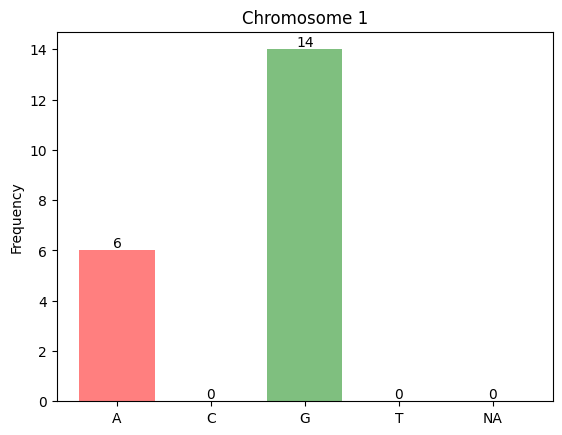

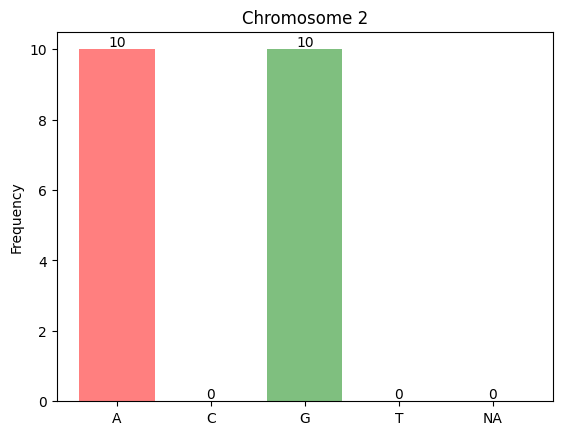

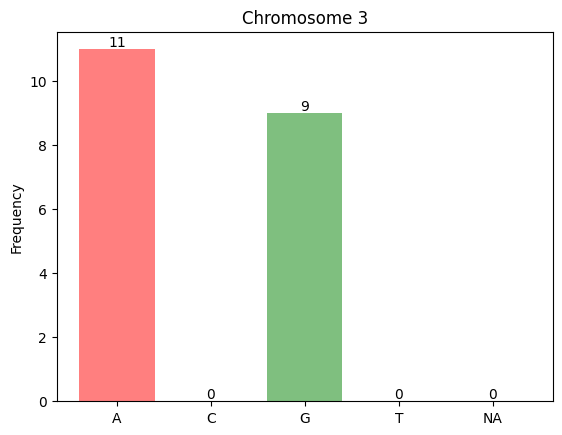

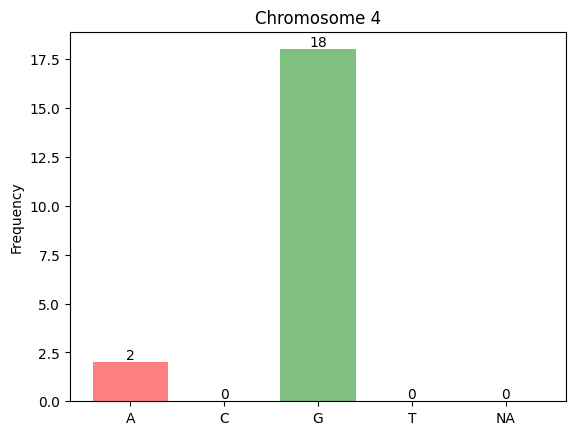

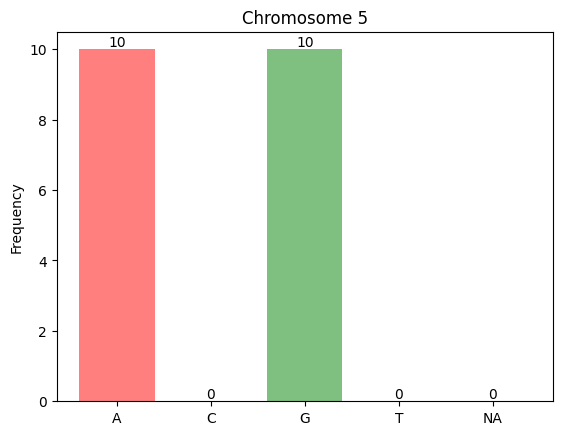

...

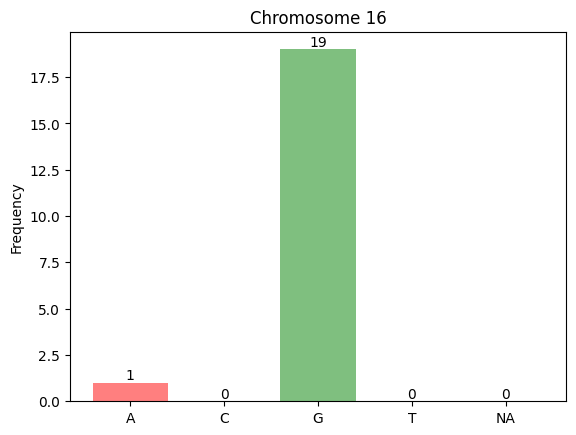

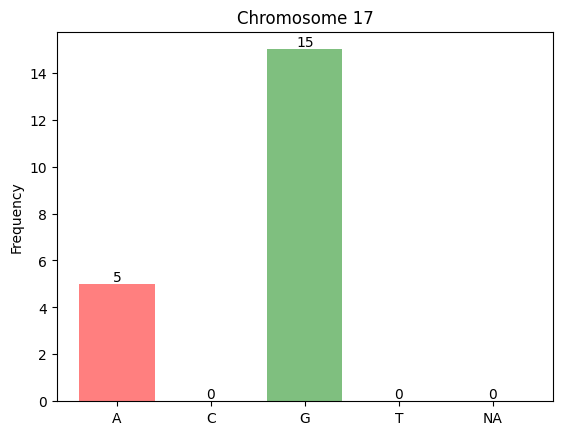

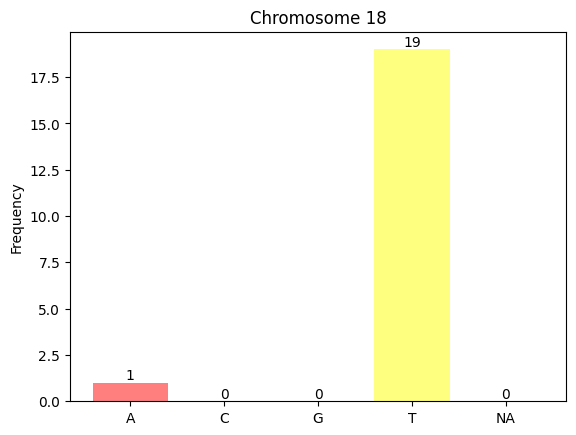

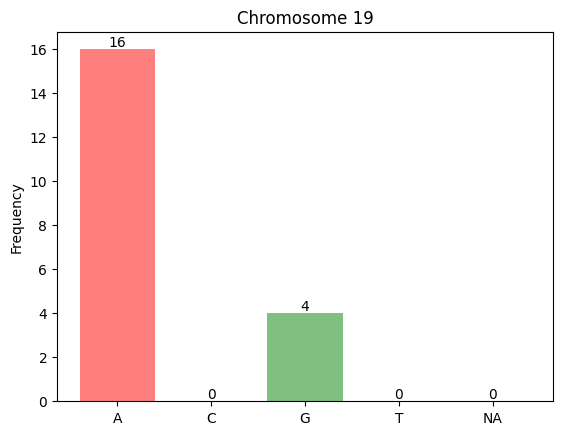

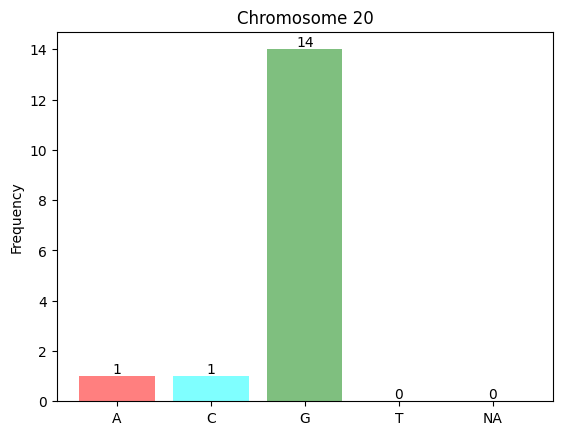

In [22]:
for k in dna_map.keys():
    display_allele(small_map[k], k)

In [12]:
def build_prefix_and_divergence_arrays(chromosome):
    X = chromosome.copy()
    M = len(X)
    for i in range(len(X)):
        X[i] = X[i].split(' ')

    N = len(X[0])

    ppa = list(range(M))

    div = [0] * M

    for k in range(N - 1):
        a = list()
        c = list()
        g = list()
        t = list()
        n = list()

        div_a = list()
        div_c = list()
        div_g = list()
        div_t = list()
        div_n = list()

        na = nc = ng = nt = nn = k + 1

        for index, match_start in zip(ppa, div):
            current = X[index]

            allele = current[k]

            if match_start > na:
                na = match_start
            if match_start > nc:
                nc = match_start
            if match_start > ng:
                ng = match_start
            if match_start > nt:
                nt = match_start
            if match_start > nn:
                nn = match_start
            
            if allele == 'A':
                a.append(index)
                div_a.append(na)
                na = 0
            if allele == 'C':
                c.append(index)
                div_c.append(nc)
                nc = 0
            if allele == 'G':
                g.append(index)
                div_g.append(ng)
                ng = 0
            if allele == 'T':
                t.append(index)
                div_t.append(nt)
                nt = 0
            if allele == 'NA':
                n.append(index)
                div_n.append(nn)
                nn = 0
            
        ppa = a + c + g + t + n
        div = div_a + div_c + div_g + div_t + div_n
    
    return ppa, div

In [13]:
ppa, div = build_prefix_and_divergence_arrays(small_map[1])

In [79]:
def display_prefix_and_divergence_arrays(X):
    ppa, div = build_prefix_and_divergence_arrays(X)
    html = '<pre style="line-height: 100%">'
    for index, match_start in zip(ppa, div):
        dna = X[index]
        html += str(index) + '|'
        for k, allele in enumerate(dna[:-1]):
            if match_start == k:
                html += '<strong><u>'
            html += str(allele)
        if match_start < len(dna) - 1:
            html += '</u></strong>'
        html += '  ' + str(dna[-1]) + '<br/>'
    html += '</pre>'
    display_html(html, raw=True)

In [17]:
display_prefix_and_divergence_arrays(small_map[1])

4|NA G G A A G G G G C C T T G G G G G G A A G G A A G G A A G G G G C C G G A A G G C C C C C C G G G G C C G G G G A A G G A A C C A A A A G G A A G G G G A A A A A A A A A A A T A G A C A C A C A C G G A T A C A C G G G G G G A A A A A A G G G G C C A A G G A A G G G G C C G G G G G G A A G G G G A A A T A C A A A G A T A C A G A A C C A A A A G G A A A A A A A T A G A G A C A G A G A C A G A G A G A C A G A G A G A G A A G G A A A A A G A G G G T T A G A G G G A C A G A T A T G G A A G G A C A C A G A G A G A C A G G G A G C C A A T T G G G G G G A G A A A C T T G G G G G G C C G G G G G G T T G G C C C C G G G G A A C C A A A A A A A A A A C C G G A A G G A A A A G G A A A A C C A G A G A G A G A A C C A G A C A G G G A C G G G G G G A G A C G G A G A C A G A G A G A G A G A G A G A C A G A T A C A G A G A C A G A A G G A A G G G G A A G G A A A A G G G G G G A A G G G G A A G G G G A A A A A A A A C G A A T T A A A A T T A A A G G G A T A G A G G G G G A C A G A G C C C C A G A G A T A A A G A C A G A G A A A A A T C C A G A G G G A A A A C C G G A A G G A A G G A A C G G G T T C C G G C C A A A A G G A A A A A A G G A A G G A A A A G G G G G G C C A A A A A A C C G G A A T T G G A A G G A A G G A A G G A A G G A A A A G G G G G G A A C C G G G G G G C C C C A A A A A G A A A C G G A G A G A C A A G G A G C C C C A A G G G G G G C G A G C C A G A G A G A G A G A G G G A G A G A A A A G G A A A A G G A A C C C C A A A A A A G G T T G G T T C C A A A A G G C C A A G G A A G G G G C C A A A A A A G G A A A A A A A A A A A A G G A A G G G G A A C C G G G G A G A G G G A G A T A A G G G G A C A G A G A G A G G G G G A A A A A A A A A A T T C C T T C C A A A A A A T T G G G G A A T T A A A A G G C C A A T T A A T T A A A A T T A A C C G G A A C C A A G G G G G G G G A A A A A A T T A G A G G G A G A A G G A A A A A G A A T T G G T T A A G G G G A C C C A C A G C C A G A G A T A C A G A G A G A A A G A A A A A G A A G G G G G G A C C G A G A C A C A G A G A G G G A G A T A A A A A C G G T T G G A A A A G G G G A A C C G G G G G G A A G G A A G G A A G G A A A A G G A A A A G G C C T T C C A A A A G G G G A A A A A A A A G G G G G G C C A A A A G G G G C C A A G G C C A A A A A A A A A A A A G G G G G G G G A A T T G G T T G G G G A A A A A A A A G G A A G G A A A A G G G G A A A A G G A A G G G G G G A A A A G G G G C C A A A A A A A A G G A A C C A A A A A A A A A A G G T T A A A A A G A C A G A G A G A G A G A G A G A A G G A A A A C C A A A G A G A C A A A A A A A A G G C C T T C C G G T T A A A A T T T T T T A A G G G G A A C C A A A A A A A A G G A G A A A G A G A C A G A C A G A G A G A T A C A T A C A G A G A G A G A A A A G G A A A A G G A G G G A A A G C G G G A A A G A G A G A C A G C G A G A C A G A C A G A G A G A G A G A G A T A G A G G G G G A G A G A G A A G G A A A A A A A A G G A A A A G G A A C C A A G G G G A A G G C C G G C C G G G G A A A A A A A A T T A A T T A A C C A A G G A A A A A A G G A A G G G G A A C C A C A G A G A G A G A G A G A A G G A A A A G G A A A A A A C C A A A G G G A G A G C G A A A A G G A G A G G G A A G G A A A G A C A A A G A C A G A A A A G G A T A A A G A G C C A A A G A G G G G G A A C G A G A G A C A G G G A G A A G G A G A G A G A G G G T T A G G G G G A A A A A A G G G G A G G G A A G G A C A G A G A G A G A G A G A G A G C C A G A A A A A A A A A A G G A G C G A A A A C G G G A A A G A G A C A C C C A G A G A G A G A G A G A G A G A G A G A G C C G G G G G G A A A T A G A A A A 2|NA G G A A G G G G C C T T G G G G G G A A G G A A G G A A G G G G C C G G A A G G C C C C C C G G G G C C G G G G A A G G A A C C A A A A G G A A G G G G A A A A A A A A A A A A G G A A C C C C C C G G A A A A C C G G G G G G A A A A A A G G G G C C A A G G A A G G G G C C G G G G G G A A G G G G A A A A A A A A G G T T A A A A A A A A A A A A A A A A C C C C T T A A A A C C G G A A C C A A G G A A A A G G G G A A G G G G A A G G G G G G G G A A A A A A A A G G C C G G T T A A G G A A G G C C C C G 

In [76]:
def get_matching_segments(chromosome):
    X = chromosome.copy()
    M = len(X)
    for i in range(len(X)):
        X[i] = X[i].split(' ')

    N = len(X[0])
    
    ppa = list(range(M))

    div = [0] * M

    for k in range(N-1):
        div.append(k+1)
        
        for i in range(M):
            m = i - 1
            n = i + 1
            match_continues = False
            if div[i] <= div[i+1]:
                while div[m+1] <= div[i]:
                    if X[ppa[m]][k] == X[ppa[i]][k]:
                        match_continues = True
                        break
                    m -= 1
            if match_continues:
                continue

            if div[i] >= div[i+1]:
                while div[n] <= div[i+1]:
                    if X[ppa[n]][k] == X[ppa[i]][k]:
                        match_continues = True
                        break
                    n += 1
            if match_continues:
                continue

            for j in range(m+1, i):
                if div[i] < k:
                    yield ppa[i], ppa[j], div[i], k
            
            for j in range(i+1, n):
                if div[i+1] < k:
                    yield ppa[i], ppa[j], div[i+1], k
            
        if k < N - 1:
            a = list()
            c = list()
            g = list()
            t = list()
            n = list()

            div_a = list()
            div_c = list()
            div_g = list()
            div_t = list()
            div_n = list()

            na = nc = ng = nt = nn = k + 1
            
            for index, match_start in zip(ppa, div):
                current = X[index]

                allele = current[k]

                if match_start > na:
                    na = match_start
                if match_start > nc:
                    nc = match_start
                if match_start > ng:
                    ng = match_start
                if match_start > nt:
                    nt = match_start
                if match_start > nn:
                    nn = match_start
                
                if allele == 'A':
                    a.append(index)
                    div_a.append(na)
                    na = 0
                if allele == 'C':
                    c.append(index)
                    div_c.append(nc)
                    nc = 0
                if allele == 'G':
                    g.append(index)
                    div_g.append(ng)
                    ng = 0
                if allele == 'T':
                    t.append(index)
                    div_t.append(nt)
                    nt = 0
                if allele == 'NA':
                    n.append(index)
                    div_n.append(nn)
                    nn = 0
                
            ppa = a + c + g + t + n
            div = div_a + div_c + div_g + div_t + div_n


In [77]:
for match in get_matching_segments(small_map[1]):
    print(match)

(3, 9, 0, 6)
(9, 3, 0, 6)
(3, 0, 4, 8)
(3, 6, 4, 8)
(3, 7, 4, 8)
(3, 10, 4, 8)
(3, 13, 4, 8)
(3, 15, 4, 8)
(3, 16, 4, 8)
(13, 0, 0, 9)
(13, 6, 0, 9)
(13, 7, 0, 9)
(13, 10, 0, 9)
(13, 15, 0, 9)
(13, 16, 0, 9)
(18, 1, 0, 82)
(18, 5, 0, 82)
(18, 11, 0, 82)
(18, 17, 0, 82)
(4, 2, 0, 88)
(4, 8, 0, 88)
(4, 12, 0, 88)
(4, 14, 0, 88)
(4, 19, 0, 88)
(18, 13, 83, 99)
(18, 5, 83, 99)
(18, 17, 83, 99)
(18, 0, 83, 99)
(18, 15, 83, 99)
(18, 4, 100, 105)
(18, 13, 100, 105)
(18, 5, 100, 105)
(18, 17, 100, 105)
(18, 0, 100, 105)
(18, 15, 100, 105)
(18, 10, 105, 109)
(18, 16, 105, 109)
(18, 2, 105, 109)
(18, 8, 105, 109)
(18, 12, 105, 109)
(18, 14, 105, 109)
(18, 19, 105, 109)
(9, 3, 7, 145)
(3, 9, 7, 145)
(10, 16, 0, 151)
(16, 10, 0, 151)
(19, 2, 0, 151)
(19, 8, 0, 151)
(19, 12, 0, 151)
(19, 14, 0, 151)
(4, 0, 87, 152)
(4, 15, 87, 152)
(2, 8, 0, 167)
(8, 2, 0, 167)
(2, 1, 167, 168)
(2, 11, 167, 168)
(2, 9, 167, 168)
(2, 13, 167, 168)
(2, 5, 167, 168)
(2, 17, 167, 168)
(2, 1, 169, 173)
(2, 11, 169, 173)

In [146]:
def display_matches(X):   
    html = '<pre style="line-height: 100%">'
    matches = sorted(get_matching_segments(X), key=itemgetter(0, 2))
    for i, sub_matches in groupby(matches, key=itemgetter(0)):
        html += 'set maximal matches for mouse %s:<br/><br/>' % i
        hi = X[i]
        html += str(i) + '|' + ''.join(map(str, hi)) + '<br/>'
        for _, j, k1, k2 in sub_matches:
            hj = X[j]
            html += str(j) + '|' + ''.join(map(str, hj[:k1]))
            html += '<strong><u>' + ''.join(map(str, hj[k1:k2])) + '</u></strong>'
            html += ''.join(map(str, hj[k2:])) + '<br/>'
        html += '<br/>'
    html += '</pre>'
    display_html(html, raw=True)

In [147]:
display_matches(small_map[1])

set maximal matches for mouse 0: 0|NA A G A G A G A G C C A T G G A G A G A G G G A G G G A G A G G G C G A G A A G G A C A C A C A G G G A C C G A G A A A G A A A C A G A G G G A A G G C G A A A A A A A G A G A T A G A C A C A C A C G G A T A C A C G G G G G G A A A A A A G G G G C C A A G G A A G G G G C C G G G G G G A A G G G G A A A A A A A A G G T T A A A A A A C C A A A A G G A A A A A A A A G G G G A A A A G G A A G G A A A A A A G G G G A A G G G G A A G G G G G G G G A A A A G G A A G G C C G G T T A A G G A A G G A A A A A A A A G G C C G G G G A A C C A A T T A A G G G G A A A A A A T T G G G G G G C C G G G G G G A T A G C C C C A G A G A G C G A G A G A G A G A C A C A G A C G G A G A G G G A A A A C C A G A G A G A G A A C C A G A C A G G G A C G G G G G G A G A C G G A G A C A G A G A G A G A G A G A G A C A G A T A C A G A G A C A G A A G G A A G G G G A A G G A A A A G G G G G G A A G G G G A A G G G G A A A A A A A A C G A G A T A A A G A T A G A G G G A A G G G G G G G G A A A A G G C C C C G G G G T T A A A G A C A G A G A A A A A T C C A G A G G G A A A A C C G G A A G G A A G G A A C G G G A T A C A G C C A G A G A G A G A A A A A G A C G G A G A C A G A G A G C G A G A C A G A C A G A G T T A G A G G G A G G G A T G G A A G G A G A G A G A G C C C C C C A A A A A A C C C C A A C C A A A A C C G G A G G G A A A T G G A A C C C C A A G G G G G G C C G G A C G G A A A A A G G G A G A G G G A G A G A G A G A G A G A A C C A A G G G G A A A A G G T T G G T T C C A G A G A G A C A G C G A A G G G G C C A A A A A A A G A G A G A G A G A G A G A G A A A A A G A G A C A G A G A G A G A G A G T T A G G G G G A A G G G G G G G G G G G G A A A A A A A A A A T T C C T T C C A A A A A A T T G G G G A A T T A A A A G G C C A A T T A A T T A A A A T T A A C C G G A A C C A A G G G G G G G G A A A A A A T T A A G G G G A A A A G G A A A A G G A A T T G G T T A A G G A A C C A A C C A A C C A A G G T T C C A A G G G G A A G G A A A A G G A A G G G G G G A A C C A A A A C C G G A A G G A A A A T T G G G G A A G G A A A A A A G G G G A G A T C C A G G G C G A G A G A A A G A G A G A G A C A G A T A G A G C G A T C G A G A G A G A G A G A G A G A G A G A G A G A C A A A A G G A G C G A G A G A C A G A G A G A G A G A C A G A G A G A G A G A T G G T T A G G G A G A G A G A T A G G G A G A G A G A A C C A G G G A G A T A G A G C G A A G G A G A G G G G G G G T T G G A G G G G G C C T T A T G G T T G G A A G G G G A G A C A G A G A G A G A G A G A G A G A G A G A G A C A G G G A A A A A G A G A G A C A G A C A T A C A G A T A G A T A T A T A T A G A G A G A G A C A G A C A C A C A G A G A G A G A G A C A G A C A G A G A G A T A C A T A C A G A G G G A G G G A C A G A C G G C C A G C C T T A G G G A G A A A G G G A G A C A G C G A G A C G G A A A A G G G G A A G G A A A A A A G G A A A A G G G G A A C C A A C C G G G G C C A G A G A C A G A G A C A G A G A G A A G G C C A G C G C G G G A A A C A A A G T T A A A T A C A C A G G G A G A C A G G G A A G G C G A A C G A A G G G G A A A A A A A A C C A A G G G G A G G G G G G G G G G G A G G G A G A G C G A G A G A A A A A A G G A A A A G G G G A A A A A A C C A A G G G G A A T T C C G G G G A A C C A A G G G G G G A A C C A A A A A A A A G G A A A A A G A A A A G G A A A A A A G G G G G G A A T T G G G G A A A A A A G G G G A A A A A A A G A G A G A G G G G G C G A G A A G G A A A A A C A G A G C G A A A A G G A A A A A A G G A A C C A A A G A G A A G G A A A A G G A A A A G G G G A C A G G G G G A G A A A A C C G G 15| NA A G A G A G A G C C A T G G A G A G A G G G A G G G A G A G G G C G A G A A G G A C A C A C A G G G A C C G A G A A A G A A A C A G A G G G A A G G C G A A A A A A A G A G A T A G A C A C A C A C G G A T A C A C G G G G G G A A A A A A G G G G C C A A G G A A G G G G C C G G G G G G A A G G G G A A A A A A A A G G T T A A A A A A C C A A A A G G A A A A A A A A G G G G A A A A G G A A G G A A A A A A G G G G A A G G A G A G A A A A G G G G G G T T A A G G G G A A

In [150]:
sorted(get_matching_segments(small_map[1]), key=itemgetter(0, 1, 2))

[(0, 1, 273, 278),
 (0, 1, 1571, 1612),
 (0, 1, 1615, 1620),
 (0, 1, 1621, 1622),
 (0, 1, 1671, 1678),
 (0, 2, 1471, 1474),
 (0, 2, 1479, 1485),
 (0, 2, 1653, 1671),
 (0, 2, 1672, 1682),
 (0, 3, 227, 248),
 (0, 3, 249, 250),
 (0, 3, 251, 252),
 (0, 3, 253, 254),
 (0, 3, 256, 257),
 (0, 3, 258, 259),
 (0, 3, 260, 264),
 (0, 3, 720, 780),
 (0, 3, 800, 811),
 (0, 3, 990, 1017),
 (0, 4, 249, 250),
 (0, 4, 251, 252),
 (0, 4, 253, 254),
 (0, 4, 256, 257),
 (0, 4, 258, 259),
 (0, 4, 260, 264),
 (0, 4, 273, 278),
 (0, 4, 337, 460),
 (0, 4, 1471, 1474),
 (0, 4, 1479, 1485),
 (0, 5, 279, 283),
 (0, 5, 1471, 1474),
 (0, 5, 1479, 1485),
 (0, 5, 1539, 1609),
 (0, 5, 1610, 1615),
 (0, 5, 1623, 1631),
 (0, 5, 1671, 1678),
 (0, 6, 335, 414),
 (0, 6, 720, 780),
 (0, 6, 1116, 1136),
 (0, 6, 1653, 1671),
 (0, 6, 1672, 1682),
 (0, 7, 249, 250),
 (0, 7, 251, 252),
 (0, 7, 253, 254),
 (0, 7, 256, 257),
 (0, 7, 258, 259),
 (0, 7, 260, 264),
 (0, 7, 720, 780),
 (0, 7, 800, 811),
 (0, 7, 1471, 1474),
 (0, 7, 1

In [209]:
def display_ibd_segments(chromosome, mouse):
    X = chromosome.copy()
    matches = sorted(get_matching_segments(X), key=itemgetter(0, 1, 2))
    mouse_matches = []
    for match in matches:
        if match[0] == mouse:
            mouse_matches.append(match)

    _, ax = plt.subplots()
    plt.plot([0,0],[0,0])
    for x in range(20):
        if x != 19:
            ax.add_patch(Rectangle((1, 20 - x), 1750, 1, fill = False))
    for match in mouse_matches:
        if match[3] - match[2] > 5:
            ax.add_patch(Rectangle((match[2], 21 - match[1]), match[3] - match[2], 1, facecolor = 'black'))


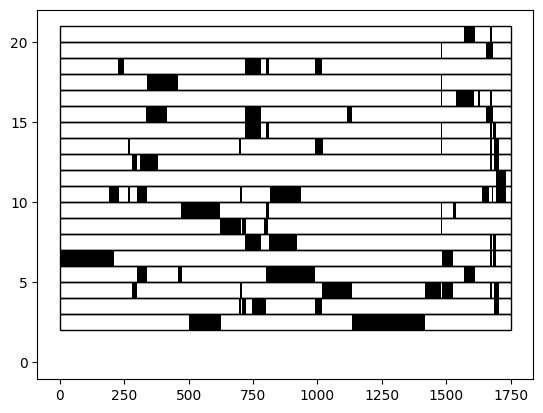

In [210]:
display_ibd_segments(small_map[1], 0)